In [1]:
import tensorflow as tf
import numpy as np
import os 
import matplotlib.pyplot as plt
import cv2
import seaborn as sns

In [2]:
def file_list_generation(path):
    for x,y,z in os.walk(path):
        path = x
        file_path = [ x+file_name for file_name in z]
    return file_path

In [3]:
image_path = file_list_generation('./dataset/images_prepped_test/')
annotation_path = file_list_generation('./dataset/annotations_prepped_test/')

In [4]:
len(image_path)

101

In [5]:
len(annotation_path)

101

In [6]:
class_names = ['sky', 'building','column/pole', 'road', 'side walk', 'vegetation', 'traffic light', 'fence', 'vehicle', 'pedestrian', 'byciclist', 'void']
colors = sns.color_palette(None, len(class_names))


def ann_to_color(ann):
    seg_img = np.zeros( (ann.shape[0],ann.shape[1], 3) ).astype('float')
  
    for c in range(12):
        segc = (ann == c)
        seg_img[:,:,0] += segc*( colors[c][0] * 255.0)
        seg_img[:,:,1] += segc*( colors[c][1] * 255.0)
        seg_img[:,:,2] += segc*( colors[c][2] * 255.0)
    return seg_img

def show(image,annotation,prediction):
    og_ann = np.max(annotation, axis=2)
    pred_ann = np.argmax(prediction,axis=2)

    og_ann_img = ann_to_color(og_ann)/255
    pred_ann_img = ann_to_color(pred_ann)/255
    pred_ann_img = cv2.resize(pred_ann_img,(image.shape[1],image.shape[0]))
    
    fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(30,10))

    ax[0].imshow(image)
    ax[0].set_title("Original Image")
    ax[1].imshow(og_ann_img)
    ax[1].set_title("Given Annotation")
    ax[2].imshow(pred_ann_img)
    ax[2].set_title("Predicted Annotation")

In [7]:
model = tf.keras.models.load_model('./tmp.h5')
def unet_predict(image_path):
    test_image = cv2.imread(image_path)
    img = cv2.resize(test_image,(128,128))
    img = np.expand_dims(img,axis=0)
    pred = model.predict(img)
    return pred

2023-02-08 17:19:49.165685: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


1/1 [==============================] - 0s 81ms/step


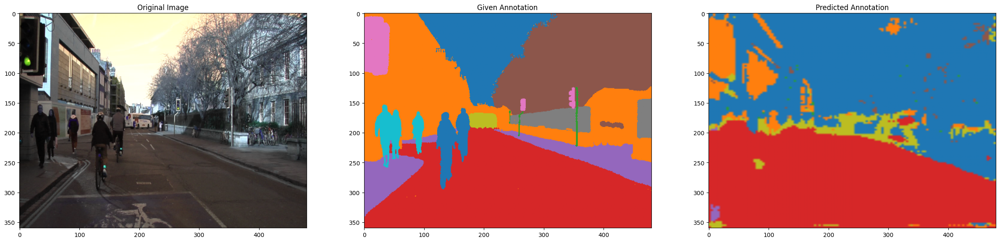

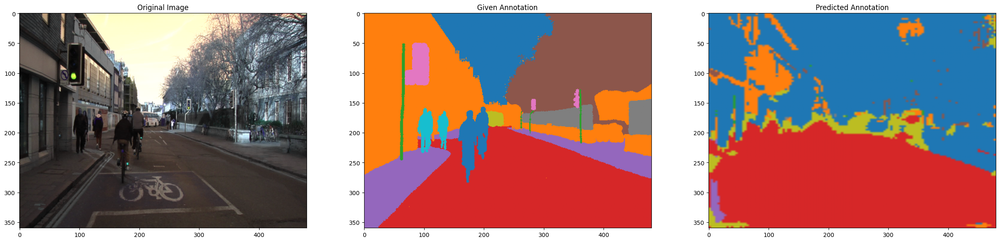

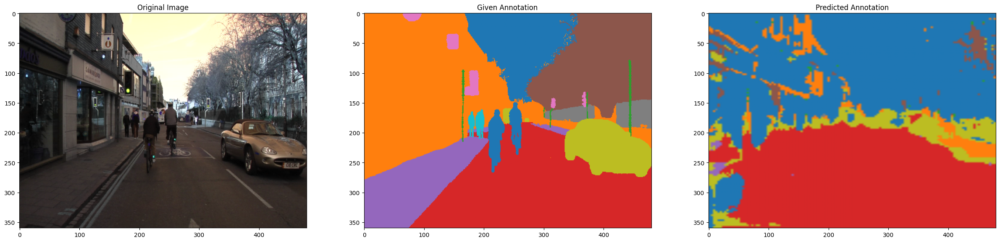

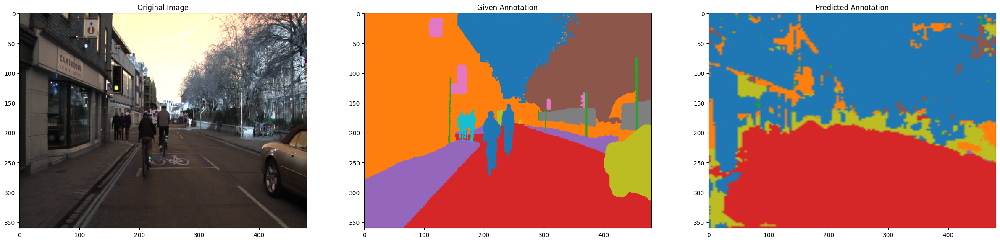

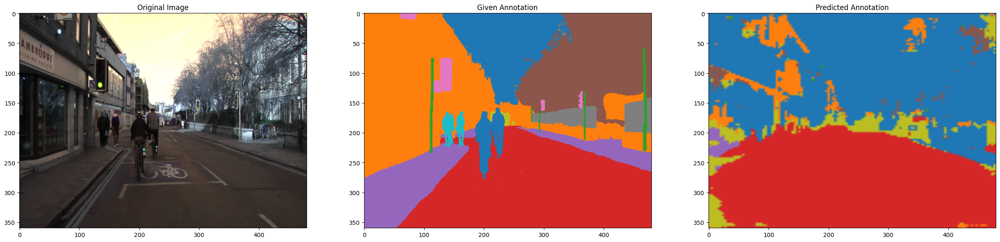

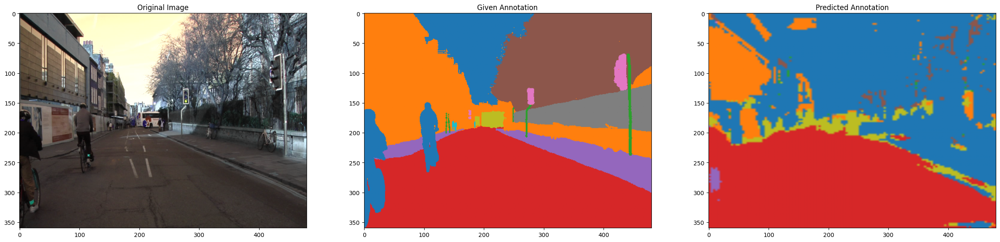

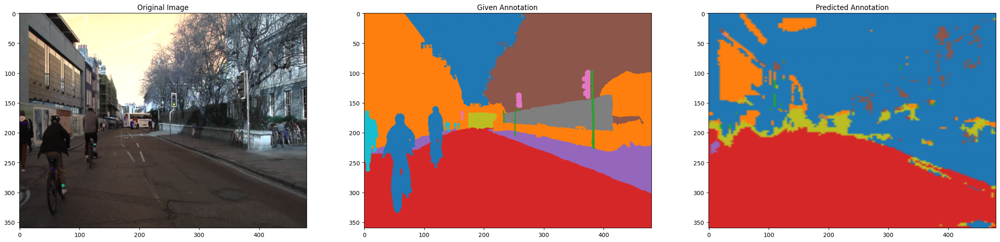

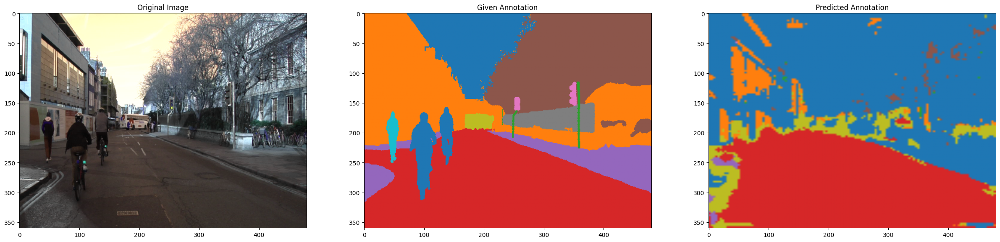

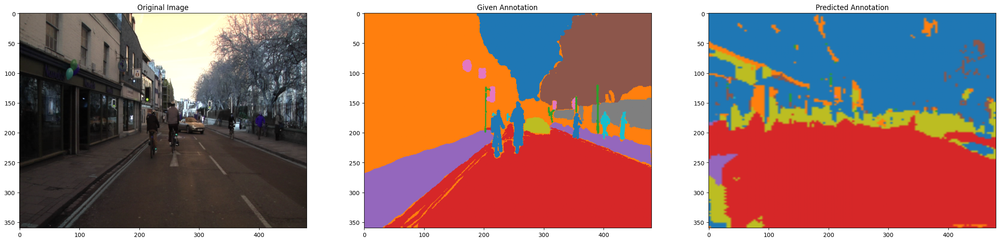

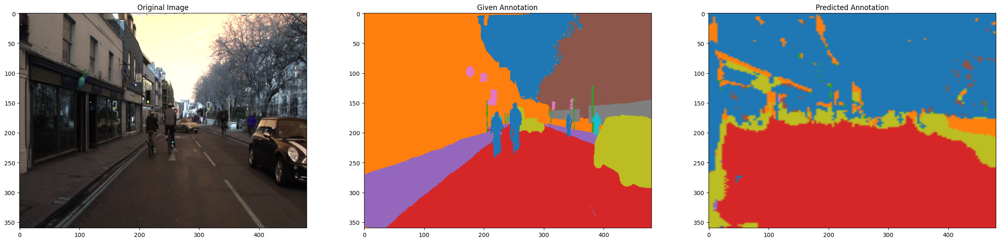

In [8]:
for i in range(10):
    show(cv2.imread(image_path[i+10]),cv2.imread(annotation_path[i+10]),unet_predict(image_path[i+10])[0])
